In [2]:
from typing import Union
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pathlib import Path
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly
from plotly.subplots import make_subplots
from pathlib import Path
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import plotly.io as pio
from sklearn.preprocessing import StandardScaler
from torch.utils.data import DataLoader, TensorDataset 
import torch  

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")


# 데이터가 많아 plotly로 시각화시 인터렉션 활성화시 팅김 주의!!!! 특히 test데이터는 더더욱
config = {
    'staticPlot': True,  # 인터랙션 비활성화 (호버, 확대/축소 등)
}



Using device: cuda


In [3]:
DATA_PATH = Path("C:/Users/lim/Desktop/귀차니즘/upstage AI/AD_project/data")
train_data = pd.read_csv(DATA_PATH / "train.csv")
test_data = pd.read_csv(DATA_PATH / "test.csv")
def process_data(df) -> pd.DataFrame:
    numeric_cols = [
        'xmeas_1', 'xmeas_2', 'xmeas_3', 'xmeas_4', 'xmeas_5', 'xmeas_6',
        'xmeas_7', 'xmeas_8', 'xmeas_9', 'xmeas_10', 'xmeas_11', 'xmeas_12',
        'xmeas_13', 'xmeas_14', 'xmeas_15', 'xmeas_16', 'xmeas_17', 'xmeas_18',
        'xmeas_19', 'xmeas_20', 'xmeas_21', 'xmeas_22', 'xmeas_23', 'xmeas_24',
        'xmeas_25', 'xmeas_26', 'xmeas_27', 'xmeas_28', 'xmeas_29', 'xmeas_30',
        'xmeas_31', 'xmeas_32', 'xmeas_33', 'xmeas_34', 'xmeas_35', 'xmeas_36',
        'xmeas_37', 'xmeas_38', 'xmeas_39', 'xmeas_40', 'xmeas_41', 'xmv_1',
        'xmv_2', 'xmv_3', 'xmv_4', 'xmv_5', 'xmv_6', 'xmv_7', 'xmv_8',
        'xmv_9', 'xmv_10', 'xmv_11', 'simulationRun'
    ]
    return df[numeric_cols]

def XMV_XMEAS(df) -> pd.DataFrame:
    numeric_cols = [
       'xmeas_1', 'xmeas_17', 'xmv_11', 'xmeas_18', 'xmeas_19', 'xmv_9', 'xmv_3'
    ]
    return df[numeric_cols]

def XMV_XMEAS_TEST(df) -> pd.DataFrame:
    numeric_cols = [
        'xmeas_1', 'xmeas_4', 'xmeas_7', 'xmeas_10', 'xmeas_11', 'xmeas_13',
       'xmeas_16', 'xmeas_17', 'xmeas_18', 'xmeas_19', 'xmeas_20', 'xmeas_21',
       'xmeas_23', 'xmeas_24', 'xmeas_25', 'xmeas_27', 'xmeas_29', 'xmeas_30',
       'xmeas_31', 'xmeas_33', 'xmeas_35', 'xmeas_36', 'xmeas_38','xmv_1', 'xmv_2', 'xmv_3', 'xmv_4', 'xmv_5', 'xmv_6', 'xmv_9', 'xmv_10',
       'xmv_11'
    ]
    return df[numeric_cols]

def XMV_XMEAS_TEST2(df) -> pd.DataFrame:
    numeric_cols = [
       'xmeas_1', 'xmeas_10', 'xmeas_17', 'xmeas_18', 'xmeas_19', 'xmeas_20', 'xmv_3', 'xmv_5', 'xmv_6', 'xmv_9', 'xmv_11'
    ]
    return df[numeric_cols]


train_a = process_data(train_data)
test_a = process_data(test_data)

train_b = XMV_XMEAS(train_data)
test_b = XMV_XMEAS(test_data)

train_c = XMV_XMEAS_TEST2(train_data)
test_c = XMV_XMEAS_TEST2(test_data)


df_cleaned = train_a.drop(columns=['simulationRun'])



In [35]:
# 데이터 스케일러 인스턴스 생성(데이터 표준화)
scaler = StandardScaler() 
# 학습 데이터셋에 대해 fit과 transform 수행: train 기준 정보 계산 및 데이터 변환
X_train_scaled = scaler.fit_transform(train_c) 
# 테스트 데이터셋에 대해서는 transform만 수행: 학습 데이터셋의 기준 정보를 사용하여 데이터 변환
X_test_scaled = scaler.transform(test_c)  

# PyTorch Tensor로 변환 
X_train_tensor = torch.FloatTensor(X_train_scaled).to(device)   
X_test_tensor = torch.FloatTensor(X_test_scaled).to(device)  

# DataLoader 설정 
train_dataset = TensorDataset(X_train_tensor, X_train_tensor) # 입력과 타겟이 같음 
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)

In [36]:
train_c.shape

(250000, 11)

In [37]:
import torch.nn as nn

class Autoencoder(nn.Module):
 def __init__(self):
    super(Autoencoder, self).__init__()
    # 인코더 구성
    self.encoder = nn.Sequential(
    nn.Linear(11, 6), # 입력 차원 55에서 낮은 차수의 중간 차원 32로 압축
    nn.ReLU(), # 활성화 함수 ReLU 사용
    nn.Linear(6, 3), # 중간 차원 32에서 특징 차원 16으로 더 압축
    nn.ReLU(), # 활성화 함수 ReLU 사용
    )
    # 디코더 구성
    self.decoder = nn.Sequential(
    nn.Linear(3, 6), # 특징 차원 16에서 중간 차원 32으로 확장
    nn.ReLU(), # 활성화 함수 ReLU 사용
    nn.Linear(6, 11), # 중간 차원 32에서 원본 차원인 55로 복원
    nn.Sigmoid() # 출력을 0과 1 사이로 조정
    )
 
 def forward(self, x):
    x = self.encoder(x) # 인코딩
    x = self.decoder(x) # 디코딩
    return x

model = Autoencoder().to(device)  
criterion = nn.MSELoss() # MSE: Mean Squared Error 
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3) # Adam optimizer

for epoch in range(100):
 for data in train_loader:
    inputs = data[0]
    optimizer.zero_grad()
    outputs = model(inputs)
    loss = criterion(outputs, inputs)
    loss.backward()
    optimizer.step()
    print(f'Epoch {epoch+1}, Loss: {loss.item()}')

Epoch 1, Loss: 1.525851845741272
Epoch 1, Loss: 1.3946453332901
Epoch 1, Loss: 1.231271505355835
Epoch 1, Loss: 1.0188266038894653
Epoch 1, Loss: 1.001443862915039
Epoch 1, Loss: 1.4020881652832031
Epoch 1, Loss: 1.1328791379928589
Epoch 1, Loss: 1.3548997640609741
Epoch 1, Loss: 1.2591753005981445
Epoch 1, Loss: 1.3374496698379517
Epoch 1, Loss: 1.2222040891647339
Epoch 1, Loss: 1.3237775564193726
Epoch 1, Loss: 1.21173095703125
Epoch 1, Loss: 1.302127480506897
Epoch 1, Loss: 1.2790197134017944
Epoch 1, Loss: 1.1927601099014282
Epoch 1, Loss: 1.155558466911316
Epoch 1, Loss: 1.292433738708496
Epoch 1, Loss: 1.151531457901001
Epoch 1, Loss: 1.0727683305740356
Epoch 1, Loss: 1.301126480102539
Epoch 1, Loss: 1.1873950958251953
Epoch 1, Loss: 1.4934266805648804
Epoch 1, Loss: 1.0000126361846924
Epoch 1, Loss: 1.3403006792068481
Epoch 1, Loss: 1.2076529264450073
Epoch 1, Loss: 1.3823001384735107
Epoch 1, Loss: 1.349377989768982
Epoch 1, Loss: 1.2740403413772583
Epoch 1, Loss: 1.23610329627

이상치 인덱스: [  2126   2132   2133 ... 710397 710398 710399]
이상치 수: 54973


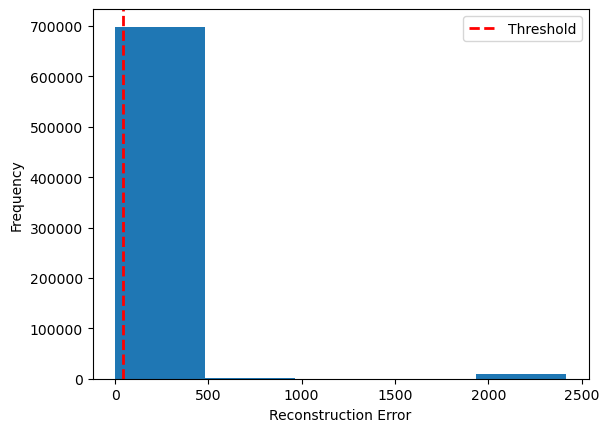

In [46]:
model.eval()  # 모델을 평가 모드로 전환
with torch.no_grad():  # 기울기 계산 비활성화
    reconstructed = model(X_test_tensor)  # 테스트 데이터 복원

# 2. 재구성 오차 계산 (Mean Squared Error)
reconstruction_errors = torch.mean((X_test_tensor - reconstructed) ** 2, dim=1)

# 3. NumPy 배열로 변환
errors = reconstruction_errors.detach().cpu().numpy()

# 4. 임계값 설정 (평균 + 3 * 표준편차 사용)
threshold = np.mean(errors) + 1 #- 0.001 * np.std(errors)

# 5. 이상치 탐지: 오차가 임계값보다 큰 데이터 찾기
outliers = np.where(errors > threshold)[0]

# 6. 결과 출력
print(f"이상치 인덱스: {outliers}")
print(f"이상치 수: {len(outliers)}")

# 7. 재구성 오차 히스토그램 시각화
import matplotlib.pyplot as plt

plt.hist(errors, bins=5)
plt.axvline(threshold, color='r', linestyle='dashed', linewidth=2, label='Threshold')
plt.xlabel('Reconstruction Error')
plt.ylabel('Frequency')
plt.legend()
plt.show()

가장 빈도가 높은 구간: 0.0029699793085455894 ~ 2.4194459915161133
이상치 인덱스: [   522    628    629 ... 710397 710398 710399]
이상치 수: 106299


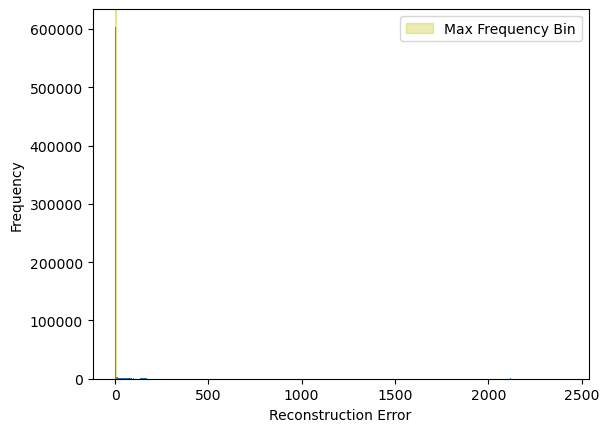

In [52]:
# 1. 히스토그램 그리기 및 데이터 얻기
counts, bins, patches = plt.hist(errors, bins=1000)

# 2. 가장 빈도가 높은 막대기의 인덱스 찾기
max_count_index = np.argmax(counts)

# 3. 가장 빈도가 높은 구간 (정상 데이터 구간)
max_bin_start = bins[max_count_index]
max_bin_end = bins[max_count_index + 1]

# 4. 정상 데이터 범위를 제외한 나머지 부분을 이상치로 지정
#outliers = np.where((errors < max_bin_start) | (errors > max_bin_end))[0]
outliers = np.where((errors > max_bin_end))[0]
# 5. 결과 출력
print(f"가장 빈도가 높은 구간: {max_bin_start} ~ {max_bin_end}")
print(f"이상치 인덱스: {outliers}")
print(f"이상치 수: {len(outliers)}")

# 6. 히스토그램 및 가장 빈도가 높은 구간 강조
plt.axvspan(max_bin_start, max_bin_end, color='y', alpha=0.3, label='Max Frequency Bin')  # 가장 높은 막대기 강조
plt.xlabel('Reconstruction Error')
plt.ylabel('Frequency')
plt.legend()
plt.show()

In [53]:
test_a['faultNumber'] = 0
test_a.loc[outliers, 'faultNumber'] = 1
test_a['faultNumber'] = test_a.groupby('simulationRun')['faultNumber'].transform(lambda x: 1 if x.max() == 1 else 0)
prit = test_a[['faultNumber']] 
prit.to_csv("test_11_100.csv", index=True)

In [54]:
import pandas as pd
from sklearn.metrics import f1_score

# 파일 불러오기 (정답 리스트와 예측 결과)
df_true = pd.read_csv('C:/Users/lim/Downloads/output.csv')  # 실제 레이블 파일
df_pred = pd.read_csv('C:/Users/lim/Desktop/귀차니즘/upstage AI/AD_project/최종날/test.csv')    # 예측 레이블 파일
#C:\Users\lim\Desktop\귀차니즘\upstage AI\AD_project\최종날\test.csv
# faultNumber 열을 기준으로 F1 스코어 계산
y_true = df_true['faultNumber']  # 실제 값
y_pred = df_pred['faultNumber']  # 예측 값

# F1 스코어 계산
f1 = f1_score(y_true, y_pred, average='weighted')  # weighted는 클래스 불균형을 고려한 평균
print(f"F1 Score: {f1}")


F1 Score: 0.8646993028455702
